#De la Imagen al Pixel


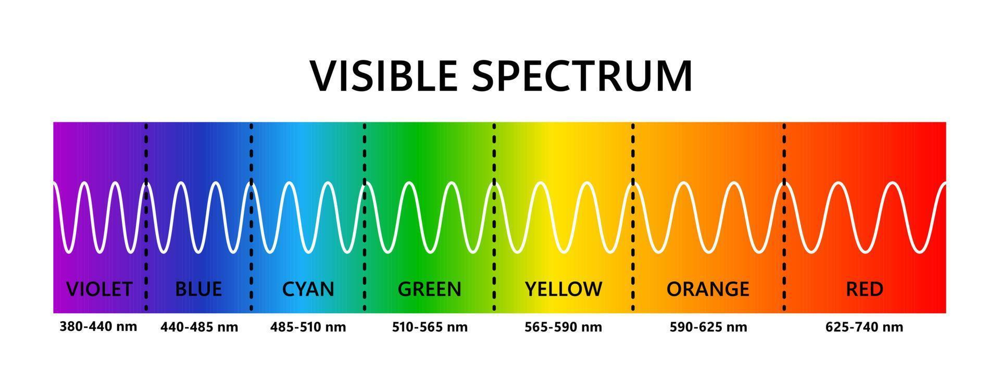

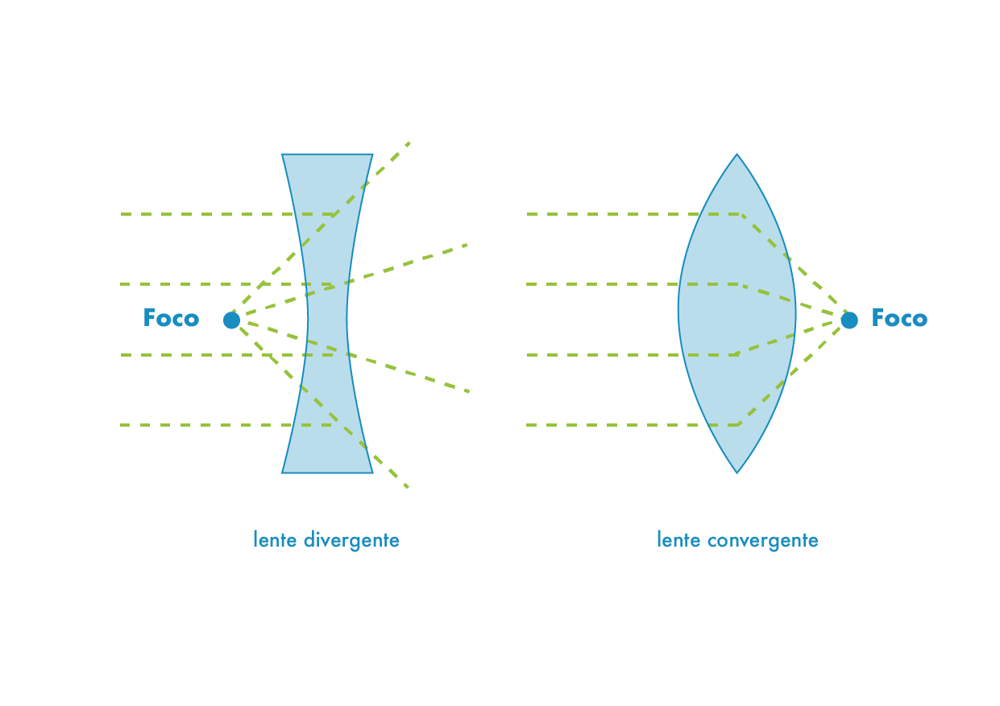

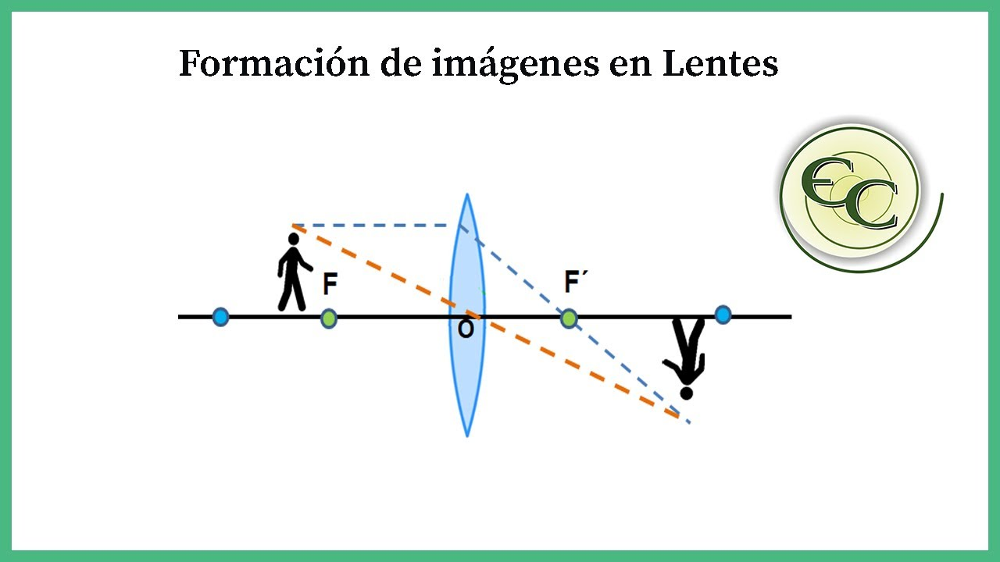

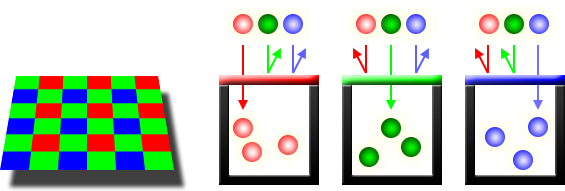

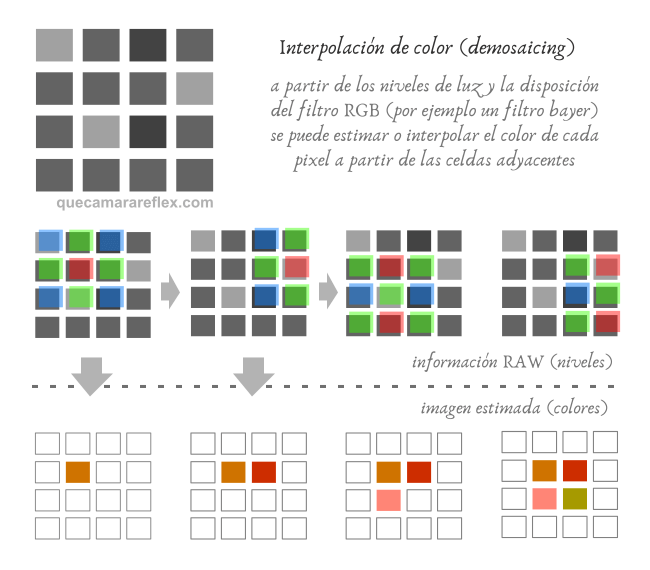

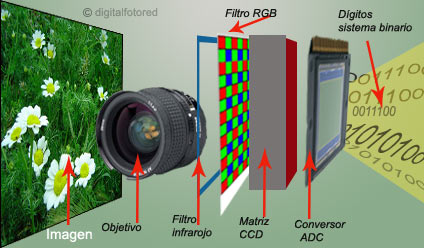

A modo introductorio, vamos a repasar a entender cómo vemos, cómo funcionan las cámaras digitales y cómo trabajamos esas imágenes con Python, especificamente con las librerias PIL, OpenCV y .

---

## ☀️ ¿Qué es la luz blanca?

La **luz blanca** es una mezcla de todas las longitudes de onda del espectro visible. Cuando pasa a través de un prisma o se refleja en gotas de agua (como en un arcoíris), se separa en los distintos colores: rojo, naranja, amarillo, verde, azul, índigo y violeta.

### 📊 Luz y ondas electromagnéticas

- La luz es una **onda electromagnética**.
- Cada color tiene una **longitud de onda** distinta:
  - Rojo: longitudes más largas (~700 nm).
  - Azul/violeta: longitudes más cortas (~400 nm).
- Lo que percibimos como color es el resultado de qué **longitudes de onda** refleja o absorbe un objeto.

---

## 👁️ ¿Por qué vemos colores?

- Los objetos reflejan algunas longitudes de onda y absorben otras.
- Nuestros ojos tienen células llamadas **conos**, sensibles a tres colores básicos:
  - Rojo
  - Verde
  - Azul
- El cerebro combina esas señales para formar la percepción del color.
- Esta base fisiológica es la que inspira el modelo **RGB** (Red, Green, Blue) de las imágenes digitales.

---

## 🔍 Óptica: lentes convergentes y divergentes

### 🔵 Lente convergente
- También llamada **lente convexa**.
- **Concentra** los rayos de luz en un punto llamado **foco**.
- Es el tipo de lente usado en el **ojo humano** y en las **cámaras**.

### 🔴 Lente divergente
- También llamada **lente cóncava**.
- **Dispersa** los rayos de luz.
- Se usa en aplicaciones ópticas correctivas, pero no para formar imágenes enfocadas en sensores.

---

## 👁️ El ojo como sistema óptico

- El **cristalino** funciona como una lente convergente.
- Proyecta una imagen invertida sobre la **retina**.
- La retina transforma la luz en señales eléctricas → cerebro.

## 📸 La cámara digital

- Tiene una **lente convergente** que enfoca la luz sobre un **sensor** (CCD o CMOS).
- Ese sensor está cubierto por una **matriz de filtros de color** llamada **Filtro de Bayer**.

---

## 🟥 Filtro de Bayer e interpolación

- El sensor digital no detecta directamente colores.
- Cada píxel tiene un filtro: rojo, verde o azul.
- La matriz tiene más verdes (50%) porque el ojo es más sensible al verde.

# TP – Comparación PIL / OpenCV / Scikit‑Image  


### 📊 Comparativa: PIL vs OpenCV vs Scikit-image

| Característica                     | **PIL**                          | **OpenCV**                             | **Scikit-image**                      |
|------------------------------------|----------------------------------|----------------------------------------|---------------------------------------|
| **Función de carga**               | `Image.open()`                   | `cv2.imread()`                         | `io.imread()`                         |
| **Formato de color por defecto**   | ✅ RGB                            | 🔁 BGR        | ✅ RGB (o RGBA)                        |
| **Tipo de salida inicial**         | Objeto `PIL.Image`               | `ndarray` (BGR)                        | `ndarray` (RGB o RGBA)                |
| **Conversión a array NumPy**       | `np.array(imagen)`               | Ya es array NumPy                      | Ya es array NumPy                     |
| **Tipo de datos (`dtype`)**        | `uint8`                          | `uint8` (o `uint16` según imread)      | `float64` (por defecto)               |
| **Normaliza valores al leer?**     | ❌ No                             | ❌ No                                   | ✅ Sí (divide por 255)                |
| **Rango de valores**               | 0 a 255                          | 0 a 255                                 | 0.0 a 1.0                             |

---



### 📊 Formatos esperados por NumPy y Matplotlib

| Característica               | **NumPy (como base de datos de imagen)** | **Matplotlib (`plt.imshow`)**             |
|-----------------------------|-------------------------------------------|-------------------------------------------|
| **Tipo de objeto**          | `np.ndarray`                              | `np.ndarray`                              |
| **Forma esperada (RGB)**    | `(alto, ancho, 3)`                        | `(alto, ancho)` para grises<br>`(alto, ancho, 3)` para color |
| **Tipo de datos (`dtype`)** | `uint8`, `float32`, `float64`, etc.       | `uint8`, `float32`, `float64`             |
| **Rango esperado (`uint8`)**| `0–255`                                   | `0–255`                                   |
| **Rango esperado (`float`)**| cualquier rango (0–1 recomendado)         | 0–1 recomendado para evitar colormap raro |
| **¿Normaliza automáticamente?** | ❌ No                               | ❌ No (pero puede interpretar raro si es `float`) |
| **¿Colormap automático?**   | ❌ No aplica (es solo el array)           | ✅ Sí: si es `float` 2D, usa `viridis` por defecto |
| **¿Permite RGBA?**          | ✅ Sí (`shape = (H, W, 4)`)               | ✅ Sí (`shape = (H, W, 4)`)                |

---

In [ ]:
# monto drive

from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#Librerias que necesito para procesar las imagenes

from PIL import Image, ImageFilter, ImageEnhance, ImageOps #libreria PILLOW
from skimage import io, color, filters, transform #libreria skimage
import cv2 #libreria OPENCV
from google.colab.patches import cv2_imshow #auxiliar de opencv para ver imagenes en colab
import numpy as np #matrices y operaciones con arrays y matrices
import matplotlib.pyplot as plt #graficos y visualizaciones
import os #manejo de archivos si trabajo local
from IPython.display import display


In [ ]:
# ruta de la imagen

image_path = "/content/drive/MyDrive/carapintada.png"   # tu ruta

In [ ]:
#Funcion para ver tres imagenes juntas comparadas
#en todos los casos quiero comparar las tres librerias
'''

IMPORTANTE: como grafico con matplotlib, de antemano cambie la imagen de OpenCV a formato RGB para matplotlib la lea bien

'''

import matplotlib.pyplot as plt
import cv2
from PIL import Image
from skimage import io

# Función para mostrar 3 imágenes lado a lado
def show_triplet(image1, image2, image3, title):
  """
  Muestra tres imágenes lado a lado: PIL, OpenCV y Scikit-image.
  image1: imagen en formato PIL
  image2: imagen en formato OpenCV (BGR)
  image3: imagen en formato Scikit-image (RGB)
  """
  # Convertir OpenCV (BGR) a RGB para que se vea bien con matplotlib
  image2_rgb = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

  # Crear figura
  fig, axes = plt.subplots(1, 3, figsize=(15, 5))

  # Mostrar imagen PIL
  axes[0].imshow(image1)
  axes[0].set_title("PIL")
  axes[0].axis("off")

  # Mostrar imagen OpenCV convertida a RGB
  axes[1].imshow(image2_rgb)
  axes[1].set_title("OpenCV")
  axes[1].axis("off")

  # Mostrar imagen Scikit-image (ya está en RGB)
  axes[2].imshow(image3)
  axes[2].set_title("Scikit-image")
  axes[2].axis("off")

  # Título general
  fig.suptitle(title)
  plt.tight_layout()
  plt.show()


## 1. Imagen original (RGB)

## 1.1 Leer  imagen

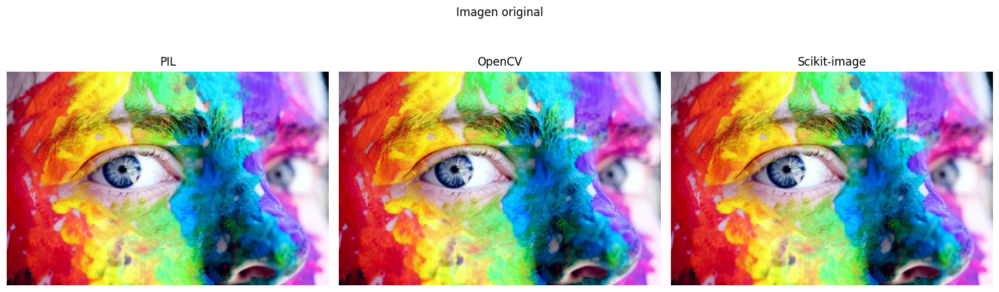

In [ ]:
'''
Acá visualicé la imagen utilizando las tres librerías
'''

original_pil = Image.open(image_path)
original_cv = cv2.imread(image_path)
original_sk = io.imread(image_path)

'''
Esta es una funcion de Matplotlib. Asi que tuve que convertir la imagen de opencv de BGR a RGB en la funcion!
'''
show_triplet(original_pil, original_cv, original_sk,'Imagen original')



##1.2 Espacio de color

In [ ]:
'''

Acá determiné el Espacio de color

IMPORTANTE: la libreria primero LEE la imagen
Tener en cuenta que OpenCV cuando LEE la imagen, asume que es RGB y la convierte en BGR

PIL: .mode
OpenCv:  .shape[i]  i=2, 3 o 4
Scikit-Image: .shape[:2]

La conclusion es que solo PIL me va a decir el espacio de color.
En cambio OpenCV y Scikit Image van a contar la cantidad de canales.
Esto puede llevar a errores porque si tiene tres canales puede ser HSV por ejemplo.
Mejor usar PIL para saber el espacio de color.
'''

# --- PIL -----------------------------------------------------------------
from PIL import Image
print("PIL: decime el espacio de color:", Image.open(image_path).mode)
# posibles salidas: 'RGB', 'RGBA', 'L', 'CMYK', etc.

# --- OpenCV --------------------------------------------------------------
import cv2
img_cv = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
espacio_cv = ("GRAY" if img_cv.ndim == 2 else
              "BGRA" if img_cv.shape[2] == 4 else
              "BGR"  if img_cv.shape[2] == 3 else
              f"{img_cv.shape[2]}‑channel")
print("OpenCV: decime el espacio de color:", espacio_cv)

# --- Scikit‑Image --------------------------------------------------------
from skimage import io
img_sk = io.imread(image_path)
espacio_sk = ("GRAY" if img_sk.ndim == 2 else
              "RGBA" if img_sk.shape[2] == 4 else
              "RGB"  if img_sk.shape[2] == 3 else
              f"{img_sk.shape[2]}‑channel")
print("Skimage: decime el espacio de color:", espacio_sk)


PIL: decime el espacio de color: RGBA
OpenCV: decime el espacio de color: BGRA
Skimage: decime el espacio de color: RGBA


## 2. Recorte

(513, 771, 4)


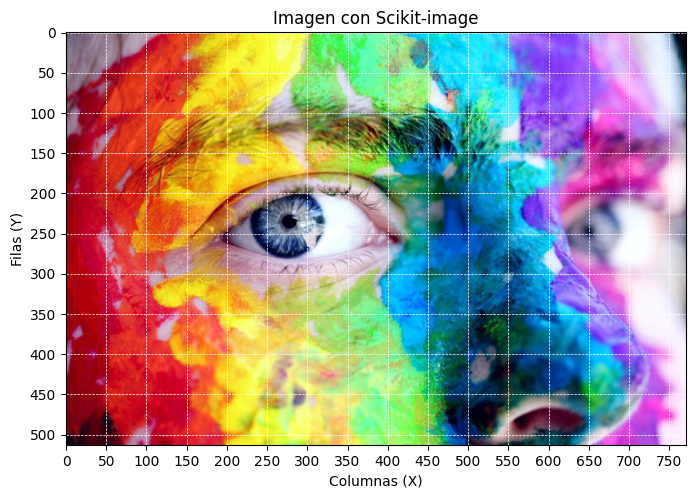

In [ ]:
'''
Quiero aislar al ojo

Asi que dibuje una cuadricula CON MATPLOTLI para calcular maso las coordenadas de recorte

'''

print(original_sk.shape)

plt.figure(figsize=(8, 6))  # Tamaño opcional

plt.imshow(original_sk)
plt.title("Imagen con Scikit-image")
plt.xlabel("Columnas (X)")
plt.ylabel("Filas (Y)")

# Agregar ticks visibles cada 50 píxeles
plt.xticks(ticks=range(0, original_sk.shape[1], 50))
plt.yticks(ticks=range(0, original_sk.shape[0], 50))

# Mostrar líneas de la grilla
plt.grid(True, color='white', linestyle='--', linewidth=0.5)

plt.show()


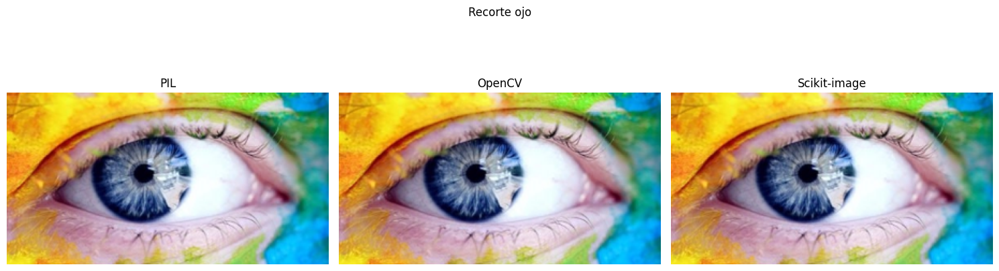

x1=150,x2=450,y1=160,y2=320


In [ ]:
'''
Le calculo mas o menos la franja donde se ve el ojo y recorto

PIL: usa funcion .crop y coordenadas, de arriba a abajo, y de izq a der
OPENCV y Scikit-image: usan slicing con NumPy, en formato [filas, columnas] = [arriba:abajo, izquierda:derecha].

'''
h,w = original_sk.shape[:2] #dimensiones de la imagen

x1=150
x2=450
y1=160
y2=320

#otra manera:
#y1,y2 = int(h*0.25), int(h*0.75) #filas
#x1,x2 = int(w*0.25), int(w*0.75) #columnas

crop_pil = original_pil.crop((x1,y1,x2,y2))
crop_cv  = original_cv[y1:y2, x1:x2]
crop_sk  = original_sk[y1:y2, x1:x2]

show_triplet(crop_pil, crop_cv, crop_sk, 'Recorte ojo')
print("x1="+str(x1)+",x2="+str(x2)+",y1="+str(y1)+",y2="+str(y2))


## 3. Escala de grises

In [ ]:
'''
La imagen vimos que es RGBA. (adenas de RGB, tiene canal ALFA)

IMPORTANTE: si queremos pasar a escala de grises, las funciones correspondientes  a cada libreria
esperan 3 canales, no 4
Si les paso 4 canales da error.

Asi que antes de pasar a escala de grises, convertimos a 3 canales RGB

pIL usa .convert
OpenCV usa cvtColor con los parametrois de imagen y cv2.COLOR_RGBA2RGB
'''

# PIL
original_pil_RGB = original_pil.convert("RGB")

# OpenCV (recordar que antes ya la habiamos convertido de BGRA a RGBA)
original_cv_RGB  = cv2.cvtColor(original_cv, cv2.COLOR_RGBA2RGB)

# Scikit‑Image
original_sk_RGB = color.rgba2rgb(original_sk)


In [ ]:
'''
Ahora que la imagen está en 3 canales,
Convertí a escala de grises

PIL usa la funcion .CONVERT y el parametro 'L' indica escala de grises
OpenCV usa la funcion .cvtcolor y parametros imagen,RGB2GRAY
Scikit Image usa la funcion .rgb2gray

'''

# PIL: convertir imagen a escala de grises ('L') y luego a array NumPy
gray_pil = original_pil_RGB.convert('L') # Y = 0.299 R + 0.587 G + 0.114 B

# OpenCV: convertir imagen a escala de grises (devuelve array 2D uint8)
gray_cv = cv2.cvtColor(original_cv_RGB, cv2.COLOR_RGB2GRAY) # Y = 0.299 R + 0.587 G + 0.114 B

# Scikit-image: convertir imagen a grises (devuelve float entre 0.0 y 1.0),
# luego escalar a 0–255 y convertir a enteros de 8 bits
gray_sk = color.rgb2gray(original_sk_RGB) # Y = 0.2126 R + 0.7152 G + 0.0722 B



Asi se ve con PIL


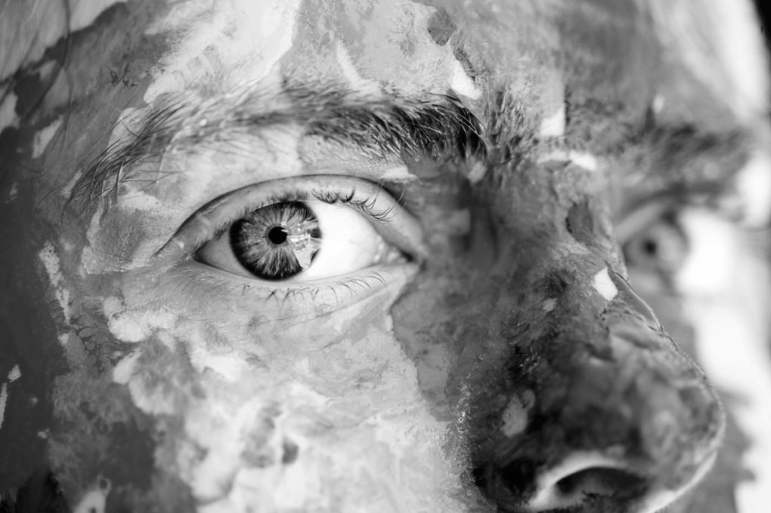

Asi se ve con OpenCV


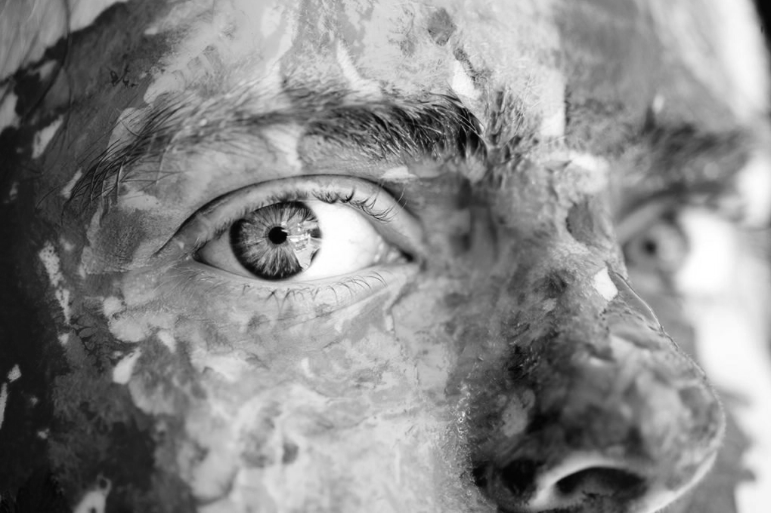

Asi se ve con Scikit-image


<ipython-input-125-c6ffa6af4095>:19: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  io.imshow(gray_sk)
<ipython-input-125-c6ffa6af4095>:20: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  io.show()


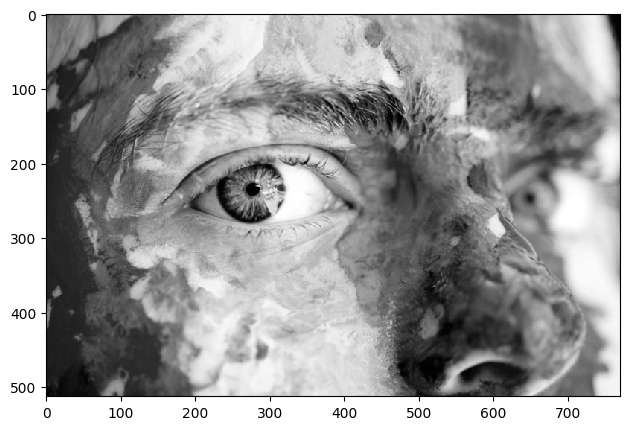

In [ ]:
'''
Verlas correctamente POR SEPARADO

En este caso usamos la libreria que corresponda

A simple vista es imperceptible, pero Scikit Image utiliza una escala diferente a OpenCV y Pil

'''
# PIL
print("Asi se ve con PIL")
display(gray_pil)  # Muestra la imagen directamente en el output de Colab

# OpenCV
print("Asi se ve con OpenCV")
cv2_imshow(gray_cv)

# Scikit-image
print("Asi se ve con Scikit-image")
io.imshow(gray_sk)
io.show()


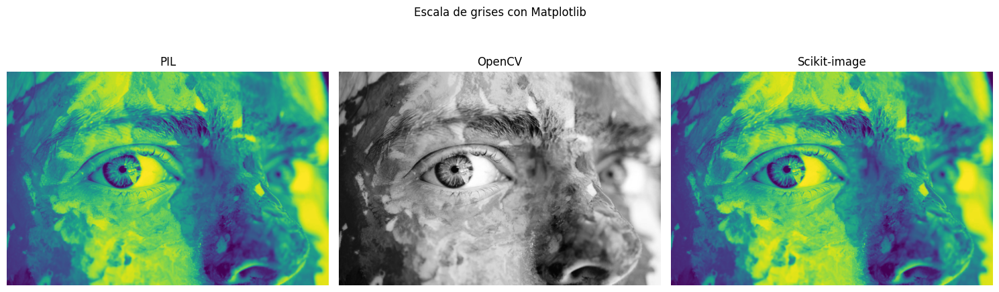

In [ ]:
'''

IMPORTANTE:
Que pasa cuando graficamos con Matplotlib???

Si matplotLib recibe de 2 dimensiones con numeros enteros asume que son grises y lo mapea a gris , ejemplo OpenCV
Pero cuando recibe 2 dimensiones con numeros float lo mapea a mapa de colores Viridis, como Skit Image despues de .rgb2gray.
Y cuando recibe 1D piensa que es un mapa de color y lo mapea a colores viridis, por ejemplo PIL despues del .convert

'''
show_triplet(gray_pil,gray_cv,gray_sk,"Escala de grises con Matplotlib")


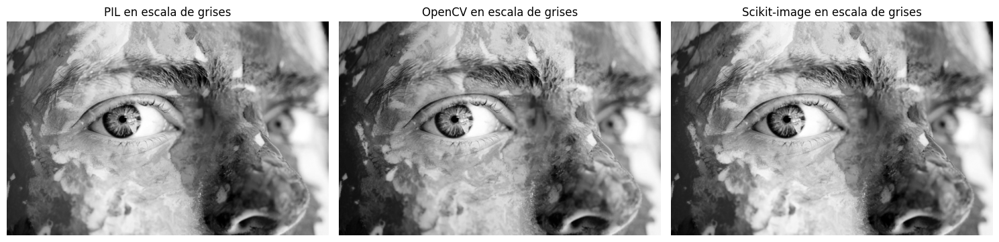

In [ ]:
'''
Como verlas correctamente con Matplotlib?

Ya las convertimos antes a escala de grises

Ahora las formateamos de una manera que Matplotlib pueda graficarlas correctamente

'''

# PIL: convertir imagen a escala de grises ('L') y luego a array NumPy
gray_pil_arraynumpy = np.array(gray_pil) # Y = 0.299 R + 0.587 G + 0.114 B

# OpenCV: convertir imagen a escala de grises (devuelve array 2D uint8)
#Matplotlib la interpreta bien asi que no necesita transformaciones extra

# Scikit-image: convertir imagen a grises (devuelve float entre 0.0 y 1.0),
# luego hay que escalar a 0–255 y convertir a enteros de 8 bits

gray_sk_uint8 = (gray_sk * 255).astype('uint8')

# Mostrar las tres imágenes en una sola figura, una al lado de la otra
fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # 1 fila, 3 columnas, tamaño grande


'''
AHORA YA ESTAN EN EL FORMATO CORRECTO PARA MATPLOTLIB
MAPEO A GRIS CON MALTPLOTLIB
'''
# Mostrar imagen PIL
axes[0].imshow(gray_pil_arraynumpy, cmap='gray')           # cmap='gray' asegura que se vea en blanco y negro
axes[0].set_title("PIL en escala de grises")    # título del subplot
axes[0].axis('off')                             # oculta los ejes

# Mostrar imagen OpenCV
axes[1].imshow(gray_cv, cmap='gray')
axes[1].set_title("OpenCV en escala de grises")
axes[1].axis('off')

# Mostrar imagen Scikit-image
axes[2].imshow(gray_sk_uint8, cmap='gray')
axes[2].set_title("Scikit-image en escala de grises")
axes[2].axis('off')

# Ajustar espacio y mostrar
plt.tight_layout()
plt.show()


## 4. Detección de bordes

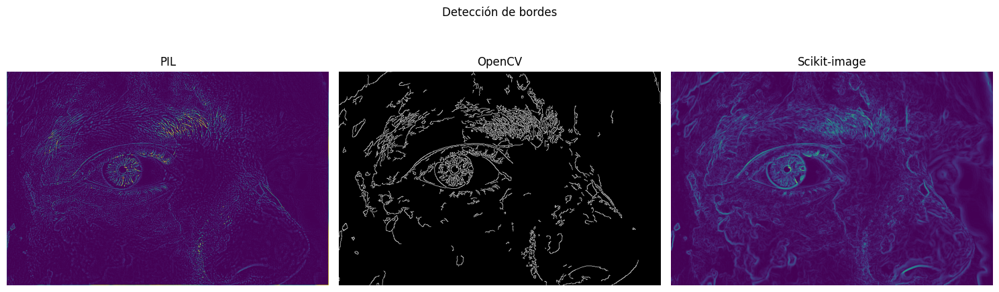

In [ ]:
'''
Aca utilizamos deteccion de bordes de cada libreria
Las funciones que detectan bordes esperan escala de grises asi que le pasamos las imagenes con la transformacion correpsondiente

Se puede notar diferencias significativas entre las 3
Esto se debe a que cada libreria usa algoritmos diferentes para cada libreria

Pil: Laplaciano
OpenCV: Canny
Scikit-Image: Sobel

'''

edges_pil = gray_pil.filter(ImageFilter.FIND_EDGES)
edges_cv  = cv2.Canny(gray_cv,100,200)
edges_sk  = filters.sobel(gray_sk)

show_triplet(edges_pil, edges_cv, edges_sk, 'Detección de bordes')


## 5. Desenfoque Gaussiano

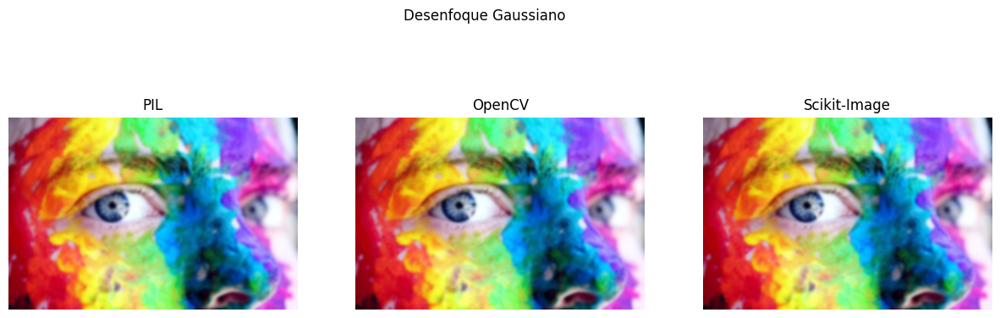

In [ ]:
'''

En el caso del desenfoque gaussiano, σ (sigma) es la desviación estándar de la campana de Gauss que se usa para desenfocar la imagen.
Es decir que si utilizamos el mismo sigma, las librerias darán el mismo resultado
ya que las tres usan la misma formula Gaussiana

'''

blur_pil = original_pil.filter(ImageFilter.GaussianBlur(radius=3))
blur_cv  = cv2.GaussianBlur(original_cv, (0, 0), sigmaX=3, sigmaY=3)
blur_sk  = filters.gaussian(original_sk, sigma=3, channel_axis=-1)

show_triplet(blur_pil, blur_cv, blur_sk, 'Desenfoque Gaussiano')


## 6. Downsampling (Muestreo espacial)

##6.1 Con paso fijo

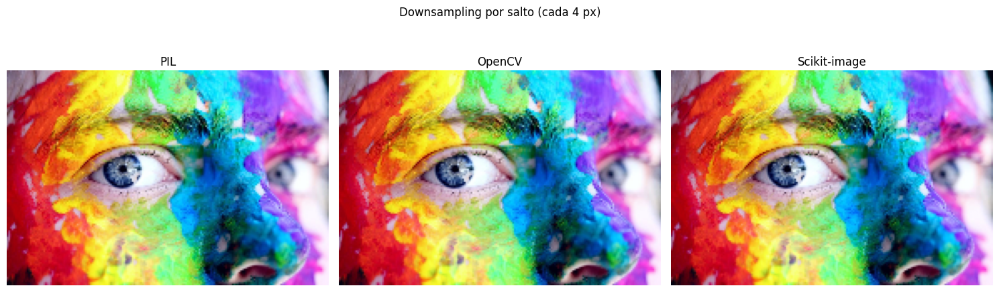

PIL - antes: (513, 771, 3) después: (129, 193, 3)
OpenCV - antes: (513, 771, 3) después: (129, 193, 3)
Scikit-Image - antes: (513, 771, 3) después: (129, 193, 3)


In [ ]:
'''
Acá hice reducción de tamaño eliminando filas y columnas directamente.

Lo que hago es quedarme con 1 de cada N filas y columnas.
Eso reduce el tamaño de la imagen sin cambiar los valores, pero puede generar aliasing (bordes raros).

Este método se llama downsampling por salto o muestreo fijo.

OJO: aca no uso las librerias, uso NUMPY
'''

# Elegimos el salto (por ejemplo, cada 4 píxeles)
salto = 4

# PIL → convertir a array para poder aplicar slicing
pil_array = np.array(original_pil_RGB)
down_pil = pil_array[::salto, ::salto]

# OpenCV (ya es array NumPy)
down_cv = original_cv_RGB[::salto, ::salto]

# Scikit-Image (también ya es array)
down_sk = original_sk_RGB[::salto, ::salto]

# Mostrar las imágenes
show_triplet(down_pil, down_cv, down_sk, f'Downsampling por salto (cada {salto} px)')

# Mostrar tamaños
print("PIL - antes:", pil_array.shape, "después:", down_pil.shape)
print("OpenCV - antes:", original_cv_RGB.shape, "después:", down_cv.shape)
print("Scikit-Image - antes:", original_sk_RGB.shape, "después:", down_sk.shape)


## 6.2 Con resizing

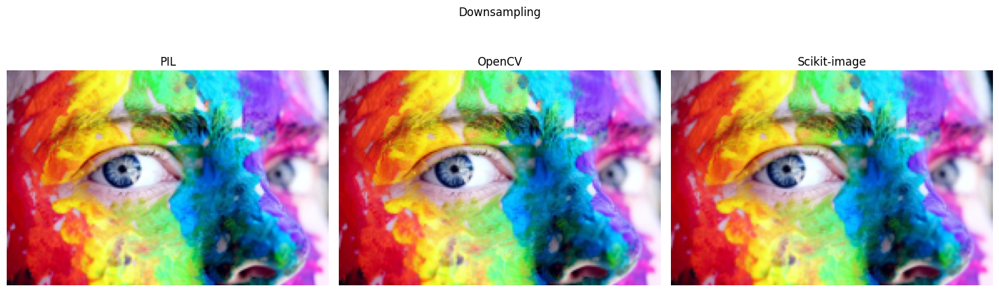

PIL - antes: (513, 771) después: (129, 193)
OpenCV - antes: (513, 771) después: (129, 193)
Scikit-Image - antes: (513, 771) después: (129, 193)


In [ ]:
'''
Acá hice reduje el tamaño de la imagen
Calcule un ratio para que la imagen más grande se reduzca a 256 píxeles en su lado más corto

Luego redimensione con la función correspondiente de cada librería

PIL: resize()
OpenCV: resize() con interpolación INTER_AREA (suaviza bordes dentados, ideal para reducir)
Scikit-Image: resize() con anti_aliasing=True para evitar bordes con ruido

hay una notable diferencia en la suavidad, no se ve tna pixelada

'''

#Voy a achicar mi imagen
#Quiero que mi imagen mida 150 de alto
# Calcular ratio de escalado
alto = original_sk.shape[0]
ancho = original_sk.shape[1]
ratio = 129 / alto #me da que proporcion quiero achicar
new_w = int(ancho * ratio)
new_h = int(alto * ratio)

# Redimensionar imágenes
down_pil_rs = original_pil.resize((new_w, new_h))
down_cv_Rs  = cv2.resize(original_cv, (new_w, new_h), interpolation=cv2.INTER_AREA)
down_sk_rs  = transform.resize(original_sk, (new_h, new_w), anti_aliasing=True)

# Mostrar comparadas
show_triplet(down_pil_rs, down_cv_rs, down_sk_rs, 'Downsampling')

# Mostrar tamaños antes y después de forma simple
print("PIL - antes:", original_pil.size[::-1], "después:", down_pil_rs.size[::-1])
print("OpenCV - antes:", original_cv.shape[:2], "después:", down_cv_rs.shape[:2])
print("Scikit-Image - antes:", original_sk.shape[:2], "después:", down_sk_rs.shape[:2])



## 7. Cuantizacion

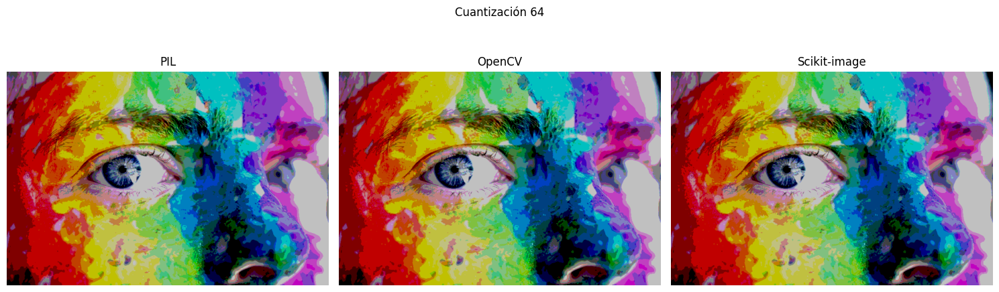

PIL      → 64 colores
OpenCV   → 64 colores
Skimage  → 64 colores


In [ ]:
'''
Acá reduje la cantidad de colores de la imagen aplicando un factor de cuantización.

Eso significa que limito cuántos valores posibles puede tener cada canal de color.
Por ejemplo, si uso un factor de 64 → 256 / 64 = 4 valores posibles por canal (0, 64, 128, 192)

Como la imagen es RGB, eso da un máximo de 4×4×4 = 64 combinaciones posibles.

La imagen mantiene su tamaño original.

'''


q=64; quant=lambda im:(im//q)*q

quant_pil=Image.fromarray(quant(np.array(original_pil_RGB)))
quant_cv=quant(original_cv_RGB)
quant_sk=quant(original_sk_uint8)
show_triplet(quant_pil, quant_cv, quant_sk, 'Cuantización 64')

# -------------------- ¿Cuántos colores resultaron? ------------------------
# Para imágenes RGB: contamos cuántos vectores [R,G,B] distintos quedaron.
def colores_unicos(img_np):
    return np.unique(img_np.reshape(-1, 3), axis=0).shape[0]

print("PIL      →", colores_unicos(np.array(quant_pil)), "colores")
print("OpenCV   →", colores_unicos(quant_cv),             "colores")
print("Skimage  →", colores_unicos(quant_sk),             "colores")


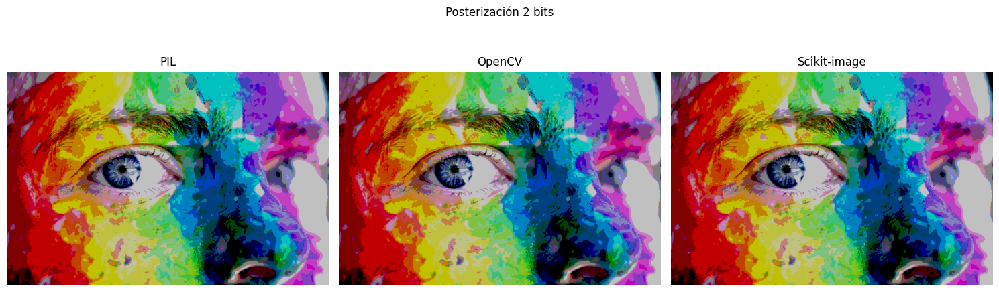

In [ ]:
'''

Acá reduje la cantidad de colores de la imagen poniendo cuantos bits quiero que tenga
pero mantiene su tamaño

'''
bits=2 # 2 elevado a la bits, es decir, 2 a la 2 nos va a dar la cantidad de colores o intensidades por canal, en este caso 4 colores por canal
factor=256//(2**bits) # esto da 64, o sea que los valores posibles dentro de los 256 son cada 64: 0, 64, 128, 192

poster_pil=ImageOps.posterize(original_pil_RGB,bits)
poster_cv=(original_cv_RGB//factor)*factor
original_sk_uint8 = (original_sk_RGB * 255).astype('uint8') # recordar que scikit image tiene los valores normalizados de 0 a 1, hay que volverlos a que esten de 0 a 255
poster_sk = (original_sk_uint8 // factor) * factor

show_triplet(poster_pil, poster_cv, poster_sk, f'Posterización {bits} bits')


## 8. Interpolación

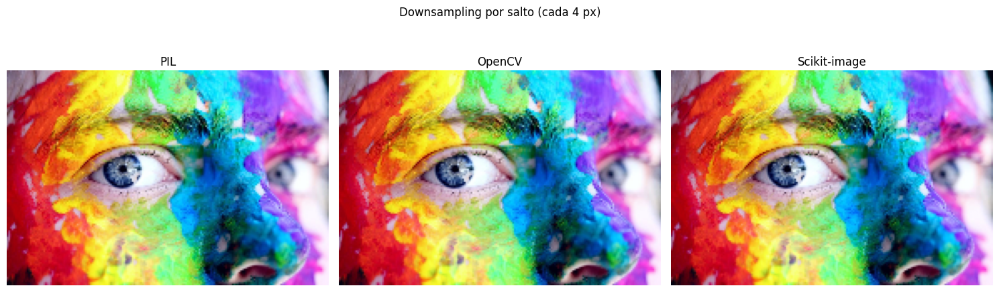

In [ ]:
'''
vAMOS A TRABAJAR CON LAS IMAGENES QUE ANTERIORMENTE LE HICIMOS MUESTREO ESPACIAL
Y QUEDARON PIXELADAS
'''
show_triplet(down_pil, down_cv, down_sk, f'Downsampling por salto (cada {salto} px)')

##8.1 Bicubica

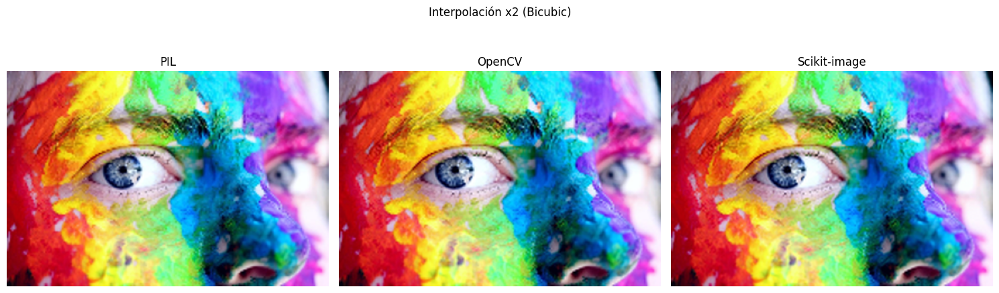

Tamaño original: (129, 193, 3)
PIL     → (258, 386, 3)
OpenCV  → (258, 386, 3)
Skimage → (258, 386, 3)


In [ ]:
'''
Acá hice una interpolación y dupliqué el tamaño) usando el mismo método en las tres librerías.

El método elegido fue BICUBICO, que genera un suavizado más suave que el vecino más cercano o el bilineal.
Es útil cuando queremos ampliar una imagen sin que se noten los bloques o dientes.

Cada librería tiene su forma de nombrar los métodos de interpolación, pero elegimos el que más se parece en cada una:

- PIL: `Image.BICUBIC`
- OpenCV: `cv2.INTER_CUBIC`
- Scikit-Image: `order=3`

Todas estas opciones corresponden al mismo tipo de interpolación (bicúbica).

--------------------------------------------------

También existen otras opciones en cada librería:

Vecino más cercano (nearest)
   - PIL: `Image.NEAREST`
   - OpenCV: `cv2.INTER_NEAREST`
   - Skimage: `order=0`

Bilineal
   - PIL: `Image.BILINEAR`
   - OpenCV: `cv2.INTER_LINEAR`
   - Skimage: `order=1`

Lanczos (más calidad, más lento)
   - PIL: `Image.LANCZOS`
   - OpenCV: `cv2.INTER_LANCZOS4`
   - Skimage: `order=5`

Dependiendo del efecto que busques (calidad o velocidad), podés cambiar el método.
'''

# Calcular nuevo tamaño (el doble del original)
new_size = (down_pil.shape[1]*2, down_pil.shape[0]*2)  # (ancho, alto)

# --- PIL ---
interp_pil = Image.fromarray(down_pil).resize(new_size, resample=Image.BICUBIC)

# --- OpenCV ---
interp_cv = cv2.resize(down_cv, new_size, interpolation=cv2.INTER_CUBIC)

# --- Scikit-image ---
interp_sk = transform.resize(
    down_pil,
    (new_size[1], new_size[0]),   # (alto, ancho)
    order=3,                      # order=3 → bicubic
    anti_aliasing=True
)

# Mostrar resultados
show_triplet(interp_pil, interp_cv, interp_sk, 'Interpolación x2 (Bicubic)')

# Mostrar tamaños
print("Tamaño original:", down_pil.shape)
print("PIL     →", np.array(interp_pil).shape)
print("OpenCV  →", interp_cv.shape)
print("Skimage →", interp_sk.shape)


## 9. Ajuste de saturación

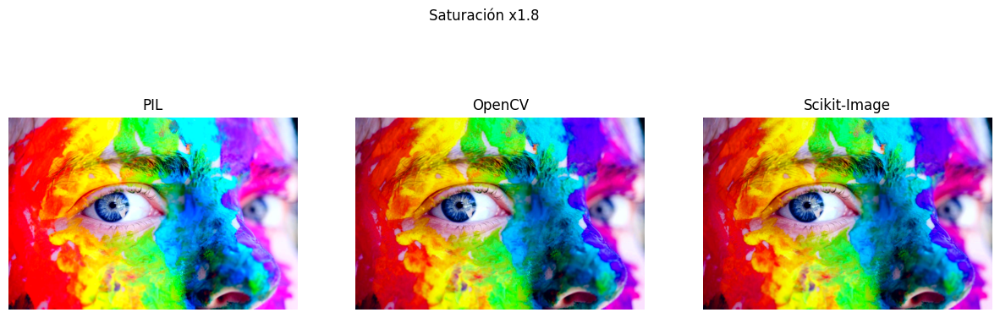

In [ ]:
'''
Acá aumenté la intensidad de los colores.
usé un factor multiplicador (en este caso 1.8).

Cada librería tiene su forma de hacerlo:

- PIL: usa `ImageEnhance.Color()`, que permite ajustar la saturación directamente con `.enhance(factor)`
- OpenCV: convierto la imagen a HSV (tono, saturación, valor), multiplico el canal S y vuelvo a RGB.
  Importante: hay que convertir a `float32` para poder multiplicar bien, y después volver a `uint8` antes de mostrar.
- Scikit-image: también paso la imagen a HSV, multiplico el canal de saturación, y vuelvo a RGB.
  En este caso, los valores están normalizados entre 0.0 y 1.0, por eso el `np.clip(..., 0, 1)`

Este tipo de ajuste se usa para reforzar los colores sin alterar la forma ni el brillo general.
'''

factor=1.8

#PIL
sat_pil=ImageEnhance.Color(original_pil).enhance(factor)

#OPENCV
hsv_cv=cv2.cvtColor(original_cv,cv2.COLOR_RGB2HSV).astype(np.float32)
hsv_cv[:,:,1]=np.clip(hsv_cv[:,:,1]*factor,0,255); sat_cv=cv2.cvtColor(hsv_cv.astype(np.uint8),cv2.COLOR_HSV2RGB)

#SCIKIT IMAGE
hsv_sk=color.rgb2hsv(original_sk); hsv_sk[:,:,1]=np.clip(hsv_sk[:,:,1]*factor,0,1); sat_sk=color.hsv2rgb(hsv_sk)


show_triplet(sat_pil, sat_cv, sat_sk, f'Saturación x{factor}')


## 10. Desafio: Segmentación y cambio de color

In [ ]:
'''

Convierto a array la imagen

'''

# Cargar imagen
img = cv2.imread(image_path)
img_np = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

In [ ]:
'''
Definir el centro del iris y el radio

'''
centro_x = 275  # coordenada horizontal (eje X)
centro_y = 235  # coordenada vertical (eje Y)
radio = 45      # tamaño del iris

# Crear una máscara del mismo tamaño que la imagen
alto, ancho = img_np.shape[:2]
Y, X = np.ogrid[:alto, :ancho]

# Máscara circular (True donde está dentro del círculo)
mascara_circular = (X - centro_x)**2 + (Y - centro_y)**2 <= radio**2


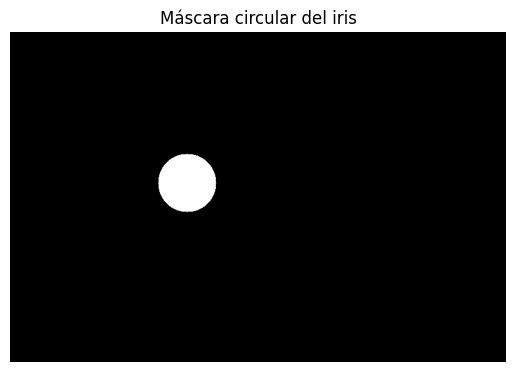

In [ ]:
'''

Ver mascara binaria

'''

plt.imshow(mascara_circular, cmap='gray')
plt.title('Máscara circular del iris')
plt.axis('off')
plt.show()


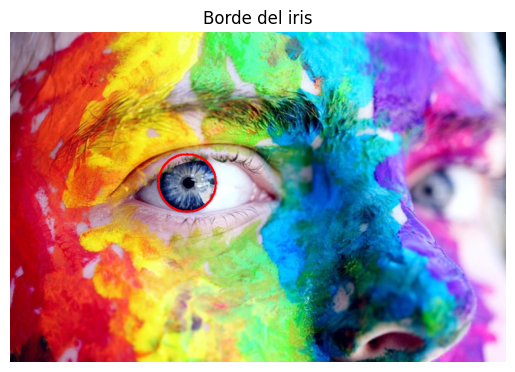

In [ ]:
'''

Ver bordes de la mascara

'''
# Convertir la máscara a formato uint8 (0–255)
mascara_uint8 = (mascara_circular.astype(np.uint8)) * 255

# Encontrar contornos
contornos, _ = cv2.findContours(mascara_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Copiar la imagen original y dibujar el contorno en rojo (BGR = (0, 0, 255))
img_bordes = img_np.copy()
cv2.drawContours(img_bordes, contornos, -1, (255, 0, 0), 2)  # RGB color: rojo

# Mostrar imagen con borde rojo del iris
plt.imshow(img_bordes)
plt.title('Borde del iris')
plt.axis('off')
plt.show()

In [ ]:
# Paso 1: copiar la imagen
img_color = img_np.copy()

# Paso 2: calcular la imagen en escala de grises
# Fórmula clásica: 0.299 R + 0.587 G + 0.114 B
gray = (0.299 * img_color[:, :, 0] +
        0.587 * img_color[:, :, 1] +
        0.114 * img_color[:, :, 2]).astype(np.uint8)

# Paso 3: crear una imagen RGB en escala de grises
gray_rgb = np.stack([gray]*3, axis=-1)

# Paso 4: aplicar el gris solo dentro de la máscara
img_gris_en_iris = img_color.copy()
img_gris_en_iris[mascara_circular] = gray_rgb[mascara_circular]


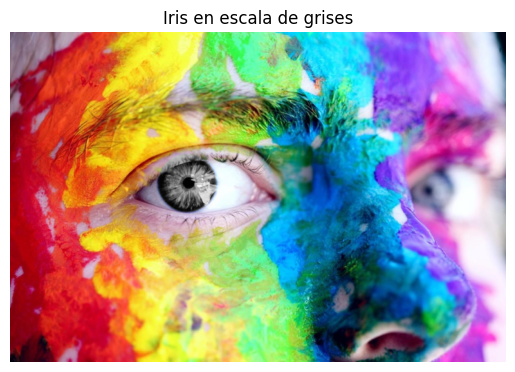

In [ ]:
plt.imshow(img_gris_en_iris)
plt.title('Iris en escala de grises')
plt.axis('off')
plt.show()
